In [2]:
 !pip install git+https://github.com/openai/whisper.git --quiet
!pip install ffmpeg-python praat-parselmouth pyttsx3 pydub gTTS --quiet

!pip install librosa transformers torchaudio --quiet

!apt-get install ffmpeg -y


  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 26.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 100.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 53.0 MB/s et

In [3]:
!pip install librosa transformers openai-whisper nltk parselmouth pydub torchaudio --quiet


import librosa
import numpy as np
import matplotlib.pyplot as plt
import whisper
import nltk
import parselmouth
from pydub import AudioSegment
from sklearn.cluster import KMeans
from sklearn.ensemble import IsolationForest
from nltk.tokenize import sent_tokenize, word_tokenize

nltk.download('punkt')


  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [4]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [5]:
import os

dataset_path = "/content/drive/MyDrive/dementia"

audio_files = [os.path.join(dataset_path, f) for f in os.listdir(dataset_path) if f.endswith(".wav")]
print(audio_files)


[]


In [6]:
import os

dementia_path = "/content/drive/MyDrive/dementia"

audio_files = []
for root, dirs, files in os.walk(dementia_path):
    for file in files:
        if file.endswith(".wav") or file.endswith(".mp3"):
            audio_files.append(os.path.join(root, file))

print(f"Total audio files found: {len(audio_files)}")
print(audio_files[:3])


Total audio files found: 131
['/content/drive/MyDrive/dementia/Dan Ingram/daningram_15.wav', '/content/drive/MyDrive/dementia/Terry Jones/terryjones_5.wav', '/content/drive/MyDrive/dementia/Maureen Forrester/maureenforrester_5.wav']


In [7]:
import IPython.display as ipd

ipd.Audio(audio_files[0])


In [8]:
import whisper

model = whisper.load_model("base")

transcriptions = []
for i, file in enumerate(audio_files[:5]):
    print(f"Transcribing file {i+1}/{len(audio_files)}: {file}")
    result = model.transcribe(file)
    transcriptions.append({
        "file": file,
        "text": result["text"]
    })

for t in transcriptions:
    print("\n🔊 File:", t["file"])
    print("📝 Transcription:", t["text"])


100%|███████████████████████████████████████| 139M/139M [00:02<00:00, 63.4MiB/s]


Transcribing file 1/131: /content/drive/MyDrive/dementia/Dan Ingram/daningram_15.wav


/usr/local/lib/python3.11/dist-packages/whisper/transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")


Transcribing file 2/131: /content/drive/MyDrive/dementia/Terry Jones/terryjones_5.wav


/usr/local/lib/python3.11/dist-packages/whisper/transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")


Transcribing file 3/131: /content/drive/MyDrive/dementia/Maureen Forrester/maureenforrester_5.wav


/usr/local/lib/python3.11/dist-packages/whisper/transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")


Transcribing file 4/131: /content/drive/MyDrive/dementia/Aileen Hernandez/aileenhernandez_0.wav


/usr/local/lib/python3.11/dist-packages/whisper/transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")


Transcribing file 5/131: /content/drive/MyDrive/dementia/Aileen Hernandez/aileenhernandez_5_1.wav


/usr/local/lib/python3.11/dist-packages/whisper/transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")



🔊 File: /content/drive/MyDrive/dementia/Dan Ingram/daningram_15.wav
📝 Transcription:  long before the blackout. Blackout was suddenly everything started to slow down. Because in those days, the tape machines were hooked up to 60 cycle current. And when the current started going down, they started rolling their own trull. And at the 527 in the middle of the newscast, poof, and we're gone. That was it. They gave me an armload of LPs and said, getting the car because the only place in the York City that had power was Lodi, New Jersey, where we had our transmitter. So we were on the air. And I was on the air at 430 in the morning doing my first talk show. I invented talk radio and everything. So we didn't have a turntable. I got an armload of records and no turntable. And I was broadcasting out of the trans...

🔊 File: /content/drive/MyDrive/dementia/Terry Jones/terryjones_5.wav
📝 Transcription:  to work. Well, yeah, but then it was the government that went to war, you know. And I was rea

In [9]:
import librosa
import parselmouth
import numpy as np

def extract_audio_features(file):
    y, sr = librosa.load(file)
    duration = librosa.get_duration(y=y, sr=sr)

    # Words per second (requires transcription)
    transcription = model.transcribe(file)["text"]
    words = transcription.strip().split()
    wps = len(words) / duration if duration > 0 else 0

    # Pause detection (silence threshold)
    intervals = librosa.effects.split(y, top_db=25)
    total_silence = duration - sum((e - s) / sr for s, e in intervals)
    pauses_per_sec = total_silence / duration if duration > 0 else 0

    # Pitch stats using Parselmouth (Praat)
    snd = parselmouth.Sound(file)
    pitch = snd.to_pitch()
    pitch_values = pitch.selected_array['frequency']
    pitch_values = pitch_values[pitch_values != 0]  # remove unvoiced
    pitch_std = np.std(pitch_values) if len(pitch_values) > 0 else 0

    return {
        "file": file,
        "duration_sec": duration,
        "words_per_sec": round(wps, 2),
        "pauses_per_sec": round(pauses_per_sec, 2),
        "pitch_variability": round(pitch_std, 2)
    }

features = [extract_audio_features(f) for f in audio_files[:5]]
import pandas as pd

df_features = pd.DataFrame(features)
df_features


/usr/local/lib/python3.11/dist-packages/whisper/transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")
/usr/local/lib/python3.11/dist-packages/whisper/transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")
/usr/local/lib/python3.11/dist-packages/whisper/transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")
/usr/local/lib/python3.11/dist-packages/whisper/transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")
/usr/local/lib/python3.11/dist-packages/whisper/transcribe.py:132: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")


,file,duration_sec,words_per_sec,pauses_per_sec,pitch_variability
0,/content/drive/MyDrive/dementia/Dan Ingram/dan...,46.0,3.02,0.10,57.58
1,/content/drive/MyDrive/dementia/Terry Jones/te...,44.0,2.95,0.09,118.93
2,/content/drive/MyDrive/dementia/Maureen Forres...,58.0,3.71,0.22,51.20
3,/content/drive/MyDrive/dementia/Aileen Hernand...,47.0,3.11,0.20,83.70
4,/content/drive/MyDrive/dementia/Aileen Hernand...,38.0,3.45,0.15,45.04


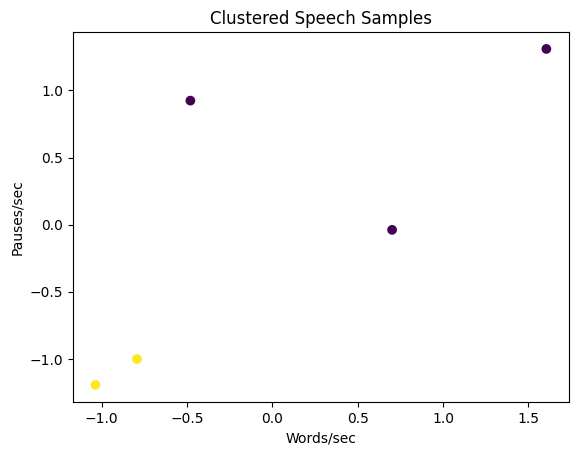

In [10]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

X = df_features[["words_per_sec", "pauses_per_sec", "pitch_variability"]].values

# Normalize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Run KMeans clustering
kmeans = KMeans(n_clusters=2, random_state=0)
df_features['cluster'] = kmeans.fit_predict(X_scaled)

# Visualize clusters
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=df_features['cluster'], cmap='viridis')
plt.xlabel('Words/sec')
plt.ylabel('Pauses/sec')
plt.title('Clustered Speech Samples')
plt.show()


In [11]:
from sklearn.ensemble import IsolationForest

iso = IsolationForest(contamination=0.2, random_state=42)
df_features['anomaly'] = iso.fit_predict(X_scaled)

# -1 = Anomaly, 1 = Normal
df_features['anomaly_label'] = df_features['anomaly'].map({1: 'Normal', -1: 'Anomalous'})
df_features


,file,duration_sec,words_per_sec,pauses_per_sec,pitch_variability,cluster,anomaly,anomaly_label
0,/content/drive/MyDrive/dementia/Dan Ingram/dan...,46.0,3.02,0.10,57.58,1,1,Normal
1,/content/drive/MyDrive/dementia/Terry Jones/te...,44.0,2.95,0.09,118.93,1,-1,Anomalous
2,/content/drive/MyDrive/dementia/Maureen Forres...,58.0,3.71,0.22,51.20,0,1,Normal
3,/content/drive/MyDrive/dementia/Aileen Hernand...,47.0,3.11,0.20,83.70,0,1,Normal
4,/content/drive/MyDrive/dementia/Aileen Hernand...,38.0,3.45,0.15,45.04,0,1,Normal


In [12]:
def count_hesitations(transcript):
    hesitation_words = ["uh", "um", "erm", "hmm", "eh", "ah"]
    words = word_tokenize(transcript.lower())
    return sum(words.count(h) for h in hesitation_words)


In [13]:
def sentence_fragmentation(transcript):
    sentences = sent_tokenize(transcript)
    short_sentences = [s for s in sentences if len(word_tokenize(s)) <= 4]
    return len(short_sentences) / len(sentences) if sentences else 0


In [14]:
from nltk.corpus import words
nltk.download('words')
english_vocab = set(words.words())

def rare_word_ratio(transcript):
    tokens = word_tokenize(transcript.lower())
    words_only = [w for w in tokens if w.isalpha()]
    rare_words = [w for w in words_only if w not in english_vocab]
    return len(rare_words) / len(words_only) if words_only else 0


[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.


In [15]:
def energy_variability(audio_file):
    y, sr = librosa.load(audio_file)
    energy = librosa.feature.rms(y=y)[0]
    return np.std(energy)


In [16]:
def extract_audio_features(audio_file):
    try:
        # Transcribe
        result = model.transcribe(audio_file)
        transcript = result['text']

        # Load audio
        y, sr = librosa.load(audio_file)
        duration = librosa.get_duration(y=y, sr=sr)

        # Basic speech rate
        words = word_tokenize(transcript)
        words_per_sec = len(words) / duration

        # Pause detection
        pauses = np.where(librosa.feature.rms(y=y)[0] < 0.01)[0]
        pauses_per_sec = len(pauses) / duration

        # Pitch variability
        pitches, magnitudes = librosa.piptrack(y=y, sr=sr)
        pitch_variability = np.std(pitches[pitches > 0])

        # NEW FEATURES:
        hesitations = count_hesitations(transcript)
        hesitation_rate = hesitations / duration
        frag_score = sentence_fragmentation(transcript)
        rare_ratio = rare_word_ratio(transcript)
        energy_var = energy_variability(audio_file)

        return {
            "file": os.path.basename(audio_file),
            "words_per_sec": words_per_sec,
            "pauses_per_sec": pauses_per_sec,
            "pitch_variability": pitch_variability,
            "hesitation_rate": hesitation_rate,
            "fragment_score": frag_score,
            "rare_word_ratio": rare_ratio,
            "energy_variability": energy_var
        }
    except Exception as e:
        print(f"Error processing {audio_file}: {e}")
        return None


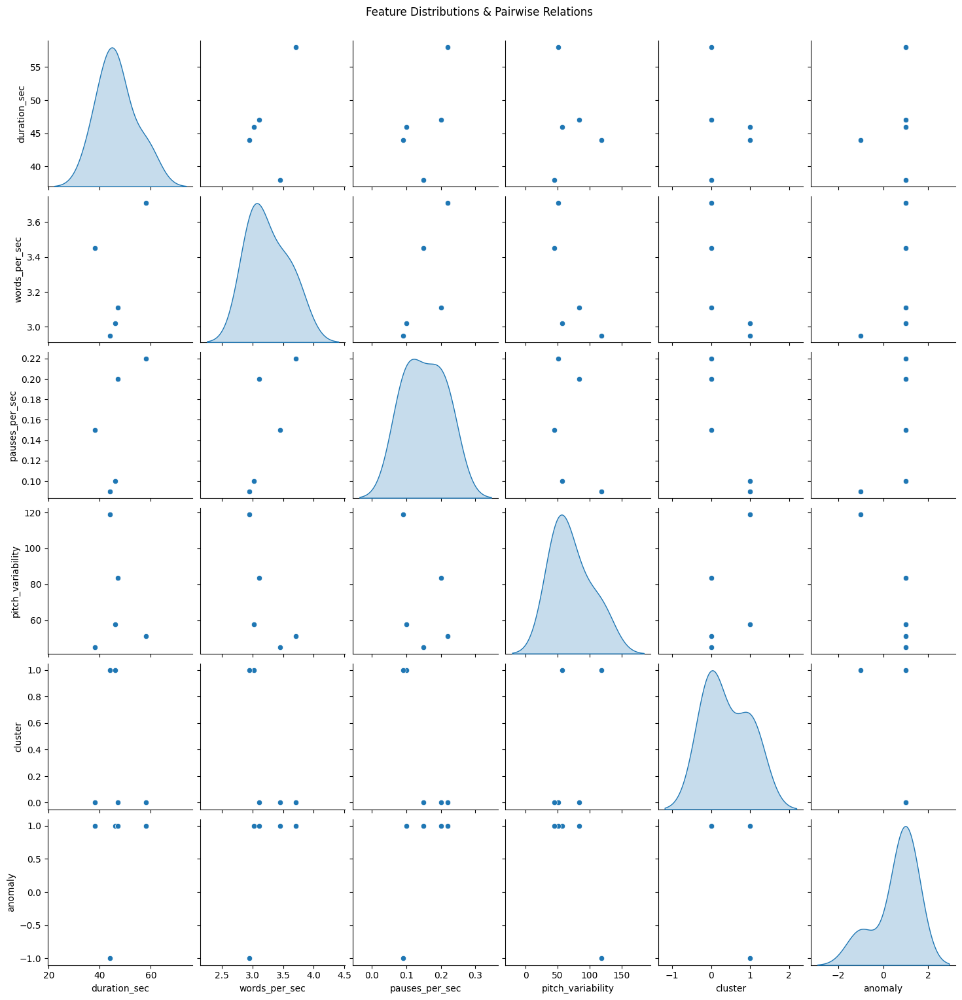

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(df_features.drop(columns=["file"]), diag_kind="kde")
sns.pairplot(df_features, hue="cluster", hue="anomaly")
plt.suptitle("Feature Distributions & Pairwise Relations", y=1.02)
plt.show()


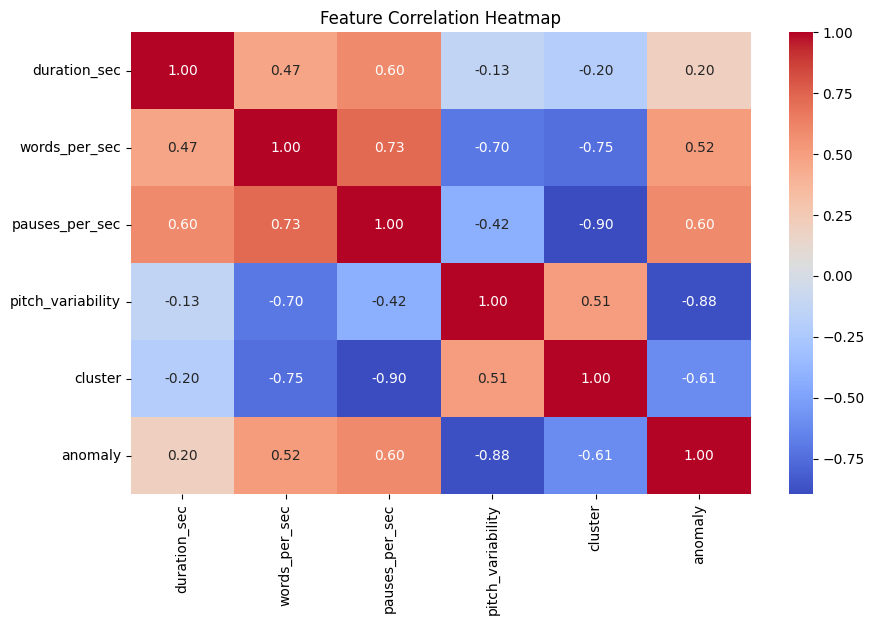

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

numeric_df = df_features.select_dtypes(include=["number"])

# Plot correlation heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(numeric_df.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Feature Correlation Heatmap")
plt.show()


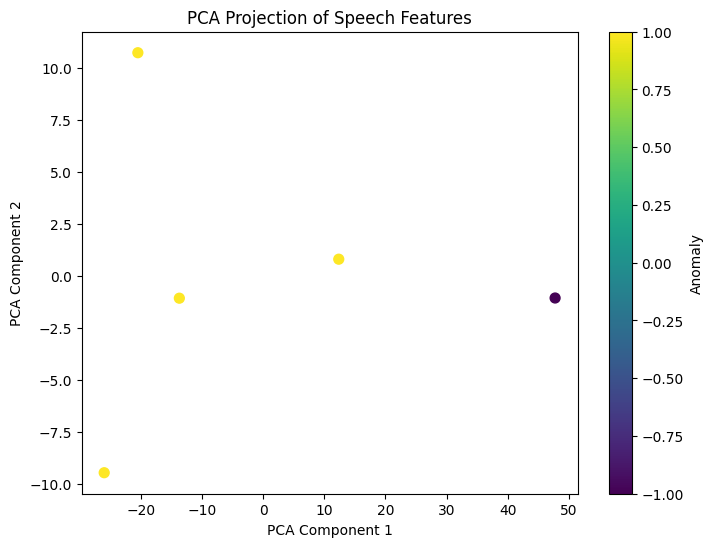

In [22]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Drop non-numeric columns safely
numeric_df = df_features.select_dtypes(include=["number"])

# Perform PCA on numeric features
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(numeric_df)

# Plot PCA scatter with clusters (if already added)
plt.figure(figsize=(8, 6))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=df_features["anomaly"], cmap="viridis", s=50)
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.title("PCA Projection of Speech Features")
plt.colorbar(label="Anomaly")
plt.show()


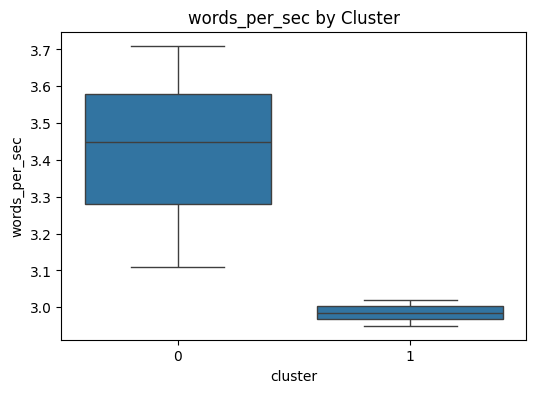

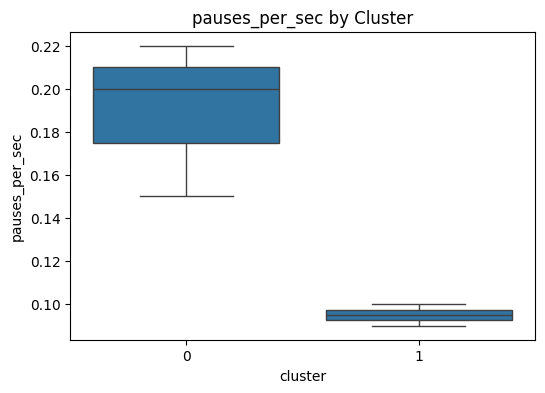

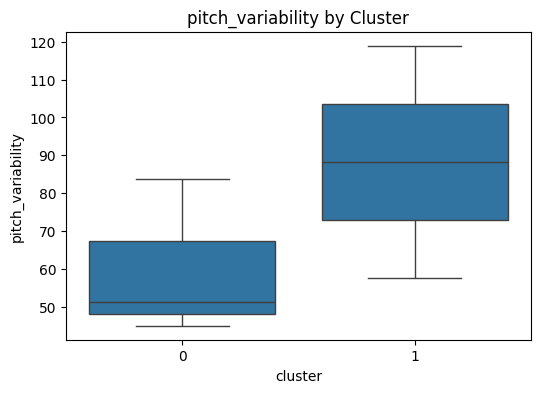

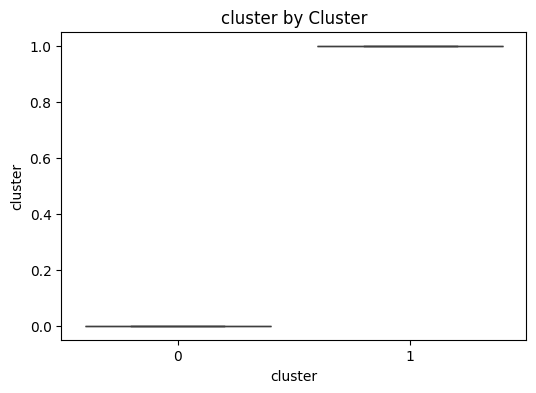

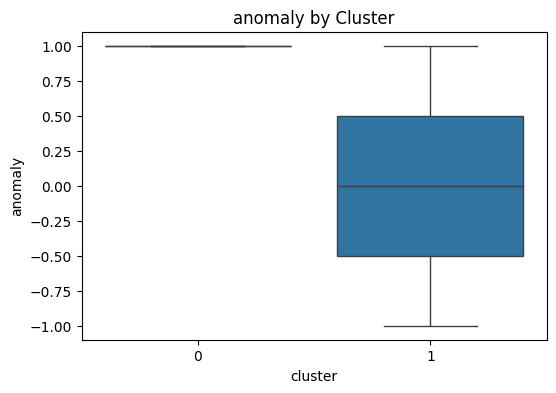

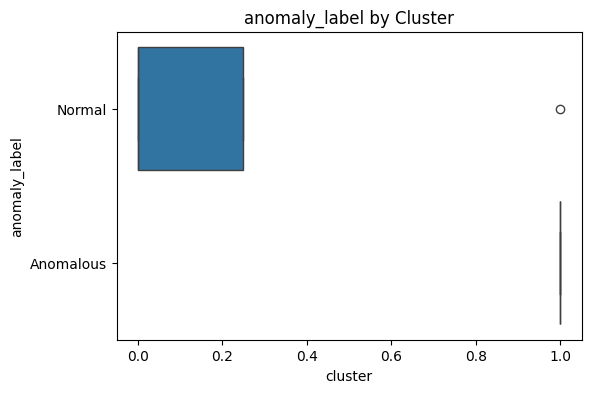

In [25]:
for feature in ["words_per_sec", "pauses_per_sec", "pitch_variability", "cluster", "anomaly", "anomaly_label"]:
    plt.figure(figsize=(6, 4))
    sns.boxplot(data=df_features, x="cluster", y=feature)
    plt.title(f"{feature} by Cluster")
    plt.show()


In [26]:
!pip install plotly --quiet


In [27]:
import plotly.express as px
fig = px.scatter_3d(df_features, x="words_per_sec", y="pauses_per_sec", z="pitch_variability",
                    color="cluster", hover_name="file")
fig.show()
